**Group 22**

Name  | Surname | Email  
---------|-------------------|---------
Julio|Vigueras|20220661@novaims.unl.pt 
Ariel|Pérez|20220662@novaims.unl.pt
Miguelanguel|Mayuare|20220665@novaims.unl.pt
Ayotunde|Aribo|20221012@novaims.unl.pt

## Bibliography

This set of notebooks were based on:

Deep Learning with Python 2nd Edition, Francois Chollet

Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition, Aurélien Géron

# Data Exploration
---

The project uses a **moth database**, extracted from Kaggle, to perform multiclass classification. This notebook shows how the database is loaded, how the training/validation/testing datasets are composed, and some examples of data visualization. 


In [ ]:
# Make the imports
import plotly.express as px
from plotly.subplots import make_subplots

import tensorflow as tf

import os
from collections import defaultdict

import numpy as np
from skimage import io


In [ ]:
# Mounts the google drive folder
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


### To download the dataset that will be used follow the next instructions. The dataset is downloaded from kaggle.

In [ ]:
# ! pip install kaggle
# ! pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


For downloading the dataset, a kaggle key API is required.

![kaggle API creation](https://media.geeksforgeeks.org/wp-content/uploads/20220511164639/Capture9.PNG)

A JSON file will be download, inside it contains the account username and key that the following cell will prompt to you.

In [ ]:
# import opendatasets as od
# od.download("https://www.kaggle.com/datasets/gpiosenka/moths-image-datasetclassification/")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: juliorojasv
Your Kaggle Key: ··········


100%|██████████| 295M/295M [00:16<00:00, 19.2MB/s]


The dataset is in the virtual machine drive now (which is purged after closing the session) if is running from colab, it is in the notebook working directory if the notebook is running locally. 

In [ ]:
# Optional, copy to google drive
# path_origin = "/content/moths-image-datasetclassification"
# path_gdrive = "/content/gdrive/MyDrive/project/moths-image-datasetclassification/"
# ! cp -r /content/moths-image-datasetclassification/  /content/gdrive/MyDrive/project/moths-image-datasetclassification/

## Visualizing the images. One sample per specie

In [ ]:
# Check how many classes are
path = "/content/gdrive/MyDrive/project/moths-image-datasetclassification/" #if the dataset was downloaded folliwing the above steps (kaggle), use this cell; otherwise, change it to your current path
classes = len(os.listdir(path + "train/"))
print(f"There are {classes} classes in the dataset.")

There are 50 classes in the dataset.


In [ ]:
## If running locally, modify the path if needed
# path = "content/moths-image-datasetclassification/"

## If you has a copy of it in your drive, then use the next line
# path = path_gdrive

#----------

def plot_each_species(set='train', first=None):
    set_path = f"{path}{set}/"
    subdirs = os.listdir(set_path)
    fig = make_subplots(rows=10, cols=5, 
                        subplot_titles=list(map(lambda x: x.capitalize(),subdirs)))
    for n, subdir in enumerate(subdirs):
        image_path = f"{set_path}{subdir}/{first}"
        img = io.imread(image_path)
        fig.add_trace(px.imshow(img).data[0], row=n//5+1, col=n%5+1)

    fig.update_layout(height=2000)
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    fig.show()


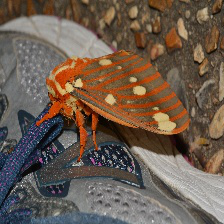
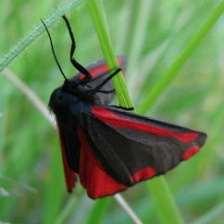
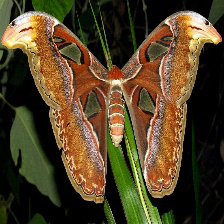
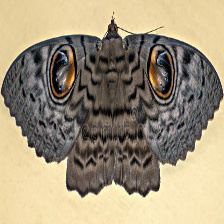
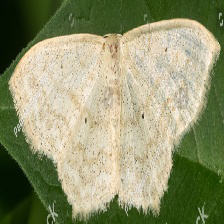
...
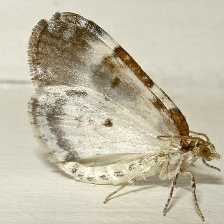
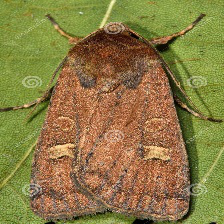
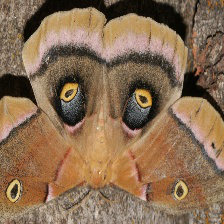
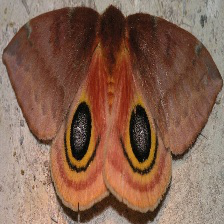
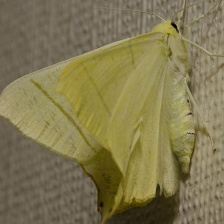

In [ ]:
plot_each_species('train', '001.jpg')


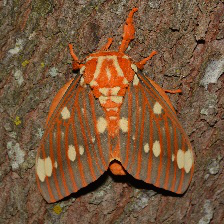
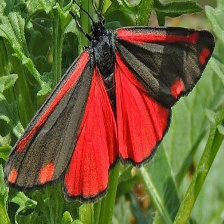
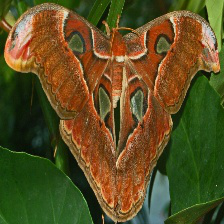
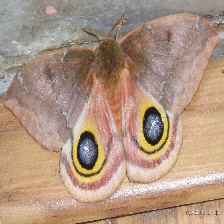
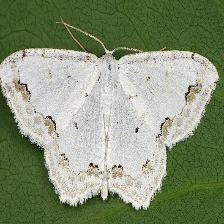
...
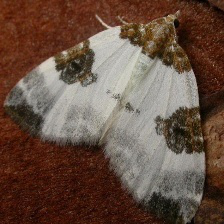
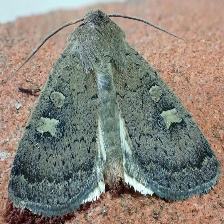
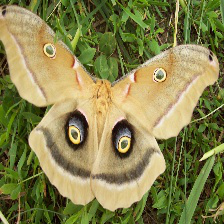
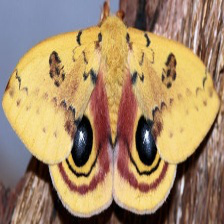
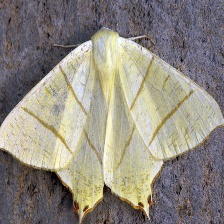

In [ ]:
# The same can be done for the validation and testing sets
plot_each_species('valid', '1.jpg')


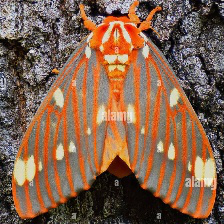
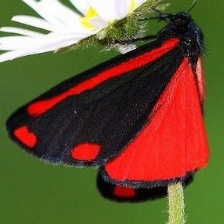
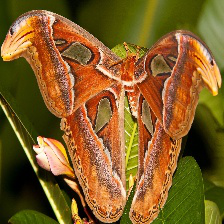
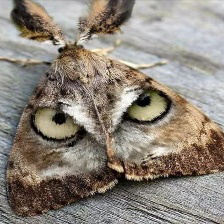
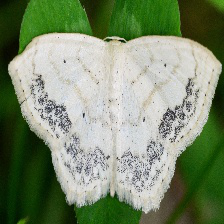
...
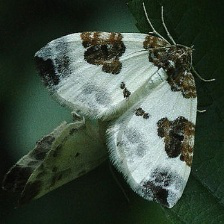
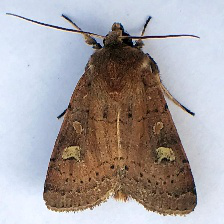
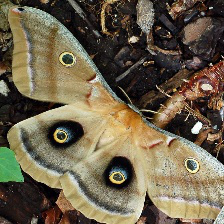
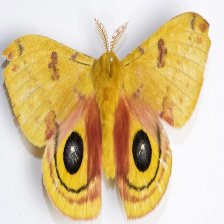
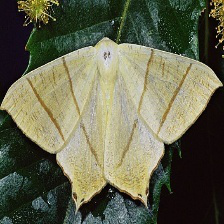

In [ ]:
plot_each_species('test', '1.jpg')

In [ ]:
# Check if all folders are well labeled
path_train = path + "train/"
path_valid = path + "valid/"
path_test = path + "test/"
(os.listdir(path_train) == os.listdir(path_valid), 
 os.listdir(path_valid) == os.listdir(path_test))

(True, True)

In [ ]:
# Check image size
image_path = path_train + "ARCIGERA FLOWER MOTH/001.jpg"
image = tf.io.read_file(image_path)
image_tensor = tf.image.decode_image(image)
height, width, channels = image_tensor.shape
print(f"The image size is {width}x{height}")

The image size is 224x224


In [ ]:
# Check if all images have same size
different_size = 0
for folder in [path_train,path_valid,path_test]: #for train folder, validation folder and test folder DO
  for moth_folder in [item for item in os.listdir(folder) if os.path.isdir(os.path.join(folder,item))]: #for each moth class DO
    for im in list(os.listdir( folder + moth_folder + "/" )): #for each image DO
      image = tf.io.read_file(folder + moth_folder + "/" + im)
      image_tensor = tf.image.decode_image(image)
      height, width, channels = image_tensor.shape
      if ( (height != 224) | (width != 224) ):
        different_size +=1

if (different_size>1):
  print("Not all images have same size")
else:
  print("All images have same size")

All images have same size


Check how many images are in each moth class folder in the training set, validation set and test set.

In [ ]:
# Count the files
def count_images(set_type="train"):
    path_update = path + set_type
    file_count = defaultdict(int)

    for root, dirs, files in os.walk(path_update):
        for file in files:
            file_count[root] += 1

    total = 0
    for dir, count in file_count.items():
        print(f"{dir}: {count} files")
        total += count
    print(f"There are {total} images")

In [ ]:
count_images("train")

train/REGAL MOTH: 154 files
train/CINNABAR MOTH: 131 files
train/ATLAS MOTH: 129 files
train/OWL MOTH: 121 files
train/LACE BORDER MOTH: 175 files
train/RUSTY DOT PEARL MOTH: 174 files
train/LEOPARD MOTH: 167 files
train/KENTISH GLORY MOTH: 175 files
train/WHITE LINED SPHINX MOTH: 143 files
train/CLEARWING MOTH: 122 files
train/BLOTCHED EMERALD MOTH: 117 files
train/MADAGASCAN SUNSET MOTH: 123 files
train/HUMMING BIRD HAWK MOTH: 143 files
train/EYED HAWK MOTH: 165 files
train/PALPITA VITREALIS MOTH: 174 files
train/BIRD CHERRY ERMINE MOTH: 133 files
train/BLACK RUSTIC MOTH: 134 files
train/FIERY CLEARWING MOTH: 139 files
train/BANDED TIGER MOTH: 136 files
train/EMPEROR GUM MOTH: 136 files
train/HORNET MOTH: 120 files
train/ARCIGERA FLOWER MOTH: 140 files
train/VESTAL MOTH: 130 files
train/PURPLE BORDERED GOLD MOTH: 104 files
train/PEACH BLOSSOM MOTH: 149 files
train/PLUME MOTH: 170 files
train/MAGPIE MOTH: 170 files
train/OLEANDER HAWK MOTH: 132 files
train/GARDEN TIGER MOTH: 131 files

In [ ]:
count_images(set_type="valid")

valid/REGAL MOTH: 5 files
valid/CINNABAR MOTH: 5 files
valid/ATLAS MOTH: 5 files
valid/OWL MOTH: 5 files
valid/LACE BORDER MOTH: 5 files
valid/RUSTY DOT PEARL MOTH: 5 files
valid/LEOPARD MOTH: 5 files
valid/KENTISH GLORY MOTH: 5 files
valid/WHITE LINED SPHINX MOTH: 5 files
valid/CLEARWING MOTH: 5 files
valid/BLOTCHED EMERALD MOTH: 5 files
valid/MADAGASCAN SUNSET MOTH: 5 files
valid/HUMMING BIRD HAWK MOTH: 5 files
valid/EYED HAWK MOTH: 5 files
valid/PALPITA VITREALIS MOTH: 5 files
valid/BIRD CHERRY ERMINE MOTH: 5 files
valid/BLACK RUSTIC MOTH: 5 files
valid/FIERY CLEARWING MOTH: 5 files
valid/BANDED TIGER MOTH: 5 files
valid/EMPEROR GUM MOTH: 5 files
valid/HORNET MOTH: 5 files
valid/ARCIGERA FLOWER MOTH: 5 files
valid/VESTAL MOTH: 5 files
valid/PURPLE BORDERED GOLD MOTH: 5 files
valid/PEACH BLOSSOM MOTH: 5 files
valid/PLUME MOTH: 5 files
valid/MAGPIE MOTH: 5 files
valid/OLEANDER HAWK MOTH: 5 files
valid/GARDEN TIGER MOTH: 5 files
valid/JULY BELLE MOTH: 5 files
valid/DEATHS HEAD HAWK MOT

In [ ]:
count_images(set_type="test")

test/REGAL MOTH: 5 files
test/CINNABAR MOTH: 5 files
test/ATLAS MOTH: 5 files
test/OWL MOTH: 5 files
test/LACE BORDER MOTH: 5 files
test/RUSTY DOT PEARL MOTH: 5 files
test/LEOPARD MOTH: 5 files
test/KENTISH GLORY MOTH: 5 files
test/WHITE LINED SPHINX MOTH: 5 files
test/CLEARWING MOTH: 5 files
test/BLOTCHED EMERALD MOTH: 5 files
test/MADAGASCAN SUNSET MOTH: 5 files
test/HUMMING BIRD HAWK MOTH: 5 files
test/EYED HAWK MOTH: 5 files
test/PALPITA VITREALIS MOTH: 5 files
test/BIRD CHERRY ERMINE MOTH: 5 files
test/BLACK RUSTIC MOTH: 5 files
test/FIERY CLEARWING MOTH: 5 files
test/BANDED TIGER MOTH: 5 files
test/EMPEROR GUM MOTH: 5 files
test/HORNET MOTH: 5 files
test/ARCIGERA FLOWER MOTH: 5 files
test/VESTAL MOTH: 5 files
test/PURPLE BORDERED GOLD MOTH: 5 files
test/PEACH BLOSSOM MOTH: 5 files
test/PLUME MOTH: 5 files
test/MAGPIE MOTH: 5 files
test/OLEANDER HAWK MOTH: 5 files
test/GARDEN TIGER MOTH: 5 files
test/JULY BELLE MOTH: 5 files
test/DEATHS HEAD HAWK MOTH: 5 files
test/COMET MOTH: 5 f

---
In this notebook we loaded the database, checked that all images had the same size and counted the number of images for each moth class.